# EE 519 — Speech AI
## HW-1 | Notebook 5: Speech Production, Sound Categories, Segmentation, Variability

**Student Name:**  
**USC ID:**  
**Date:**  

---

### Learning Objectives
By completing this notebook, you will:
- Practice recording and analyzing **speech sounds** (vowels, consonants)
- Connect **speech production** (voicing, place/manner) to signal patterns
- Perform **basic segmentation**: words → syllables → phones (approx.)
- Study **variability** across repeated recordings and speakers
- Identify **coarticulation** in real speech using waveform + spectrogram + listening

> ⚠️ **Important**
> - All answers (code + explanations) must be written **inside this notebook**
> - Do **not** delete questions or prompts
> - Clearly label all plots (title, axes, units)
> - Use **relative paths only** and keep audio under `./audio/` for grading


### Grading (Notebook 5 — 20 points)

| Component | Points |
|---|---:|
| Recording/collection of required sounds + clean organization | 4 |
| Variability analysis (same speaker repeats + multi-speaker) | 5 |
| Segmentation (words/syllables/phones) with evidence | 6 |
| Speech production explanations (voiced/voiceless, manner/place cues) | 3 |
| Clarity, structure, reflections | 2 |

> We grade **understanding and reasoning**, not perfection.


---

# 0. Setup (Reproducibility)

This notebook must run **quickly and reproducibly** for grading.

## ✅ Reproducibility requirements
- Put all audio files in `./audio/` (relative paths only)
- No absolute paths, no cloud mounts
- We should be able to download your ZIP and run this notebook top-to-bottom

Recommended structure:
```
HW1/
├── HW1_Notebook5_Speech_Production_Segmentation_Variability.ipynb
└── audio/
    ├── speaker_self/
    ├── speaker_2/           (optional but recommended)
    └── speaker_3/           (optional)
```

## Recording requirements (minimum)
You must collect at least:
### (A) Same-speaker repetition
Record yourself saying the sentence **3 times**:
- Prompt: **“My name is _____. I am taking a speech AI course.”**
Save as:
- `./audio/speaker_self/sent_1.wav`
- `./audio/speaker_self/sent_2.wav`
- `./audio/speaker_self/sent_3.wav`

### (B) Sound categories (self)
Record these **isolated sounds** (≈1–2 sec each):
- Vowels: /a/ and /i/
- Fricatives (unvoiced): /s/ and /f/
Save as:
- `./audio/speaker_self/vowel_a.wav`
- `./audio/speaker_self/vowel_i.wav`
- `./audio/speaker_self/fric_s.wav`
- `./audio/speaker_self/fric_f.wav`

### (C) Multi-speaker (recommended)
Record the same sentence from **at least one other person** (friend/classmate) OR use a public speech clip.
Save as:
- `./audio/speaker_2/sent_1.wav`

> If you cannot record another person, you must explain why and use a public clip as “speaker_2”.


In [1]:
# TODO: Imports
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display


In [2]:
# TODO: WAV loader (reuse from Notebook 1/3)
import os
from scipy.io import wavfile

def to_mono(x):
    """Ensure mono float32 in [-1, 1]."""
    x = np.asarray(x)
    if x.ndim == 2:  # stereo -> mono
        x = x.mean(axis=1)
    if np.issubdtype(x.dtype, np.integer):
        maxv = np.iinfo(x.dtype).max
        x = x.astype(np.float32) / maxv
    else:
        x = x.astype(np.float32)
    return np.clip(x, -1.0, 1.0)

def load_wav(path):
    if not os.path.exists(path):
        # print(f"File not found: {path}\nUpload a WAV and update wav_path.")
        raise FileNotFoundError(f"File not found: {path}")
    else:
        fs, x = wavfile.read(path)
        x = to_mono(x)
        print("Loaded:", path)
        print("Sampling rate (Hz):", fs)
        print("Duration (s):", len(x)/fs)
        print(f"Min/max amplitude: {x.min():.3f}/{x.max():.3f}")
        return x, fs



In [28]:
# TODO: Helpers
import librosa
import librosa.display
import soundfile as sf
import sounddevice as sd

def play_audio(x, fs):
    display(Audio(x, rate=fs))

def plot_waveform(x, fs, title="Waveform", tlim=None):
    # raise NotImplementedError
    t = np.arange(len(x)) / fs
    plt.figure(figsize=(10, 2))
    plt.plot(t, x, linewidth=0.8)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")    
    plt.title(title)
    if tlim is not None:
        plt.xlim(tlim)
    plt.show()

def plot_spectrogram(x, fs, title, n_fft=1024, win_ms=25, hop_ms=10):
    # raise NotImplementedError
    S = np.abs(librosa.stft(x, n_fft=n_fft, hop_length=hop_ms))
    S_db = librosa.amplitude_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_db, sr=fs, hop_length=hop_ms, x_axis='time', y_axis='hz')
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.tight_layout()
    plt.show()

def record_wav(fn, fs_orig=16000, duration=4.0):

    print("Recording... Speak now!")
    rec = sd.rec(int(duration * fs_orig), samplerate=fs_orig, channels=1, dtype='float32')
    sd.wait()
    x = rec[:, 0]

    # Normalize
    x = x / (np.max(np.abs(x)) + 1e-12)

    print("Done recording.")
    print("Sampling rate:", fs_orig, "Hz")
    print("Num samples:", len(x))

    # Save (optional)
    sf.write(fn, x, fs_orig)
    print(f"Saved to {fn}")

    display(Audio(x, rate=fs_orig))

def magnitude_spectrum(x, fs):
    """Return f (Hz) and magnitude (dB or linear)."""
    # raise NotImplementedError
    n = len(x)
    x_w = x * np.hanning(n).astype(np.float32)

    # compute fft and freq axis
    X = np.fft.rfft(x_w)
    freqs = np.fft.rfftfreq(n, d=1/fs)
    mag = 20*np.log10(np.abs(X) + 1e-12)
    return freqs, mag

def plot_spectrum(f, mag):
    plt.figure(figsize=(12, 4))
    plt.plot(f, mag, linewidth=1.0)
    plt.title("Magnitude vs Frequency")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude (dB)")
    plt.xlim(0, fs/2)
    plt.grid(True)
    plt.show()

## Record

In [ ]:
# "My name is _____. I am taking a speech AI course."
record_wav("audio/speaker_self/sent_1.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/sent_1.wav


In [ ]:
# "My name is _____. I am taking a speech AI course."
record_wav("audio/speaker_self/sent_2.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/sent_2.wav


In [8]:
# "My name is _____. I am taking a speech AI course."
record_wav("audio/speaker_self/sent_3.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/sent_3.wav


In [9]:
record_wav("audio/speaker_self/vowel_a.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/vowel_a.wav


In [10]:
record_wav("audio/speaker_self/vowel_i.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/vowel_i.wav


In [11]:
record_wav("audio/speaker_self/fric_s.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/fric_s.wav


In [12]:
record_wav("audio/speaker_self/fric_f.wav")

Recording... Speak now!
Done recording.
Sampling rate: 16000 Hz
Num samples: 64000
Saved to audio/speaker_self/fric_f.wav


---

# 1. Organize and Load Your Recordings

### Task
Create a Python dictionary that lists your file paths.

**Do not hardcode absolute paths**. Use the provided relative path patterns.

Then load each file, print:
- fs
- duration
- min/max amplitude

> If sampling rates differ, document what you do (resample or keep separate).


In [13]:
# TODO: Provide your paths here
paths = {
    "self_sent_1": "./audio/speaker_self/sent_1.wav",
    "self_sent_2": "./audio/speaker_self/sent_2.wav",
    "self_sent_3": "./audio/speaker_self/sent_3.wav",
    "vowel_a": "./audio/speaker_self/vowel_a.wav",
    "vowel_i": "./audio/speaker_self/vowel_i.wav",
    "fric_s": "./audio/speaker_self/fric_s.wav",
    "fric_f": "./audio/speaker_self/fric_f.wav",
    # Optional / recommended:
    "speaker2_sent_1": "./audio/speaker_2/sent_1.wav",
}


### Note

I used the audio clip from brightspace for speaker 2 since I did this on my desktop.

In [14]:
# TODO: Load all recordings into a dict: signals[name] = (x, fs)
signals = {}
for name, p in paths.items():
    signals[name] = load_wav(p)


Loaded: ./audio/speaker_self/sent_1.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.739/1.000
Loaded: ./audio/speaker_self/sent_2.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.901/1.000
Loaded: ./audio/speaker_self/sent_3.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.566/1.000
Loaded: ./audio/speaker_self/vowel_a.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.731/1.000
Loaded: ./audio/speaker_self/vowel_i.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.938/1.000
Loaded: ./audio/speaker_self/fric_s.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.900/1.000
Loaded: ./audio/speaker_self/fric_f.wav
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.835/1.000
Loaded: ./audio/speaker_2/sent_1.wav
Sampling rate (Hz): 16000
Duration (s): 3.5170625
Min/max amplitude: -0.761/1.000


### Quick sanity check
For 2–3 files:
- Plot waveform
- Plot spectrogram
- Play audio


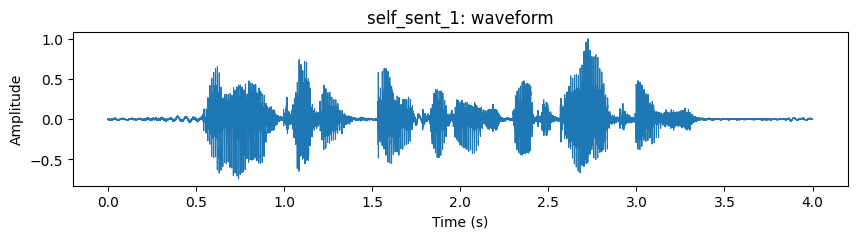

c:\Users\K\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


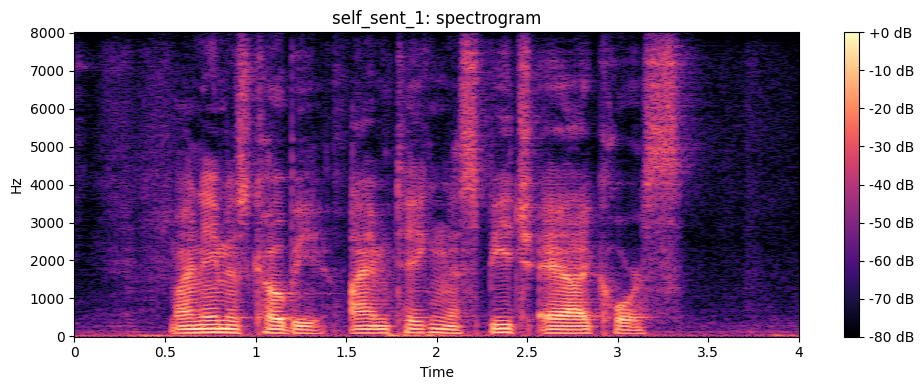

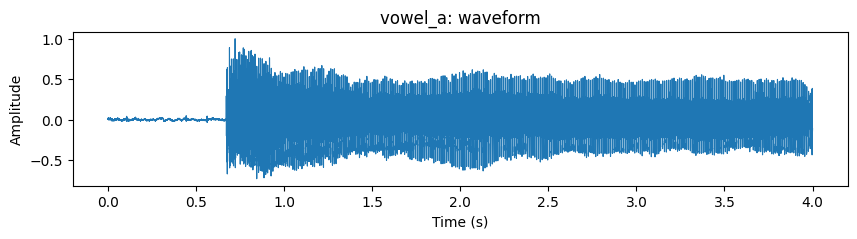

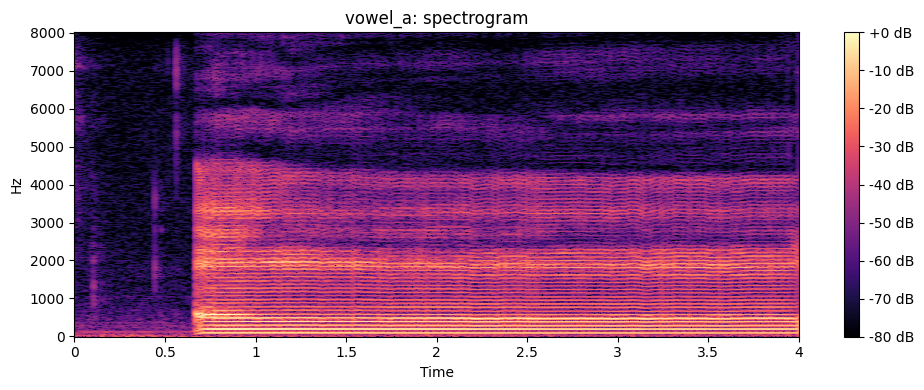

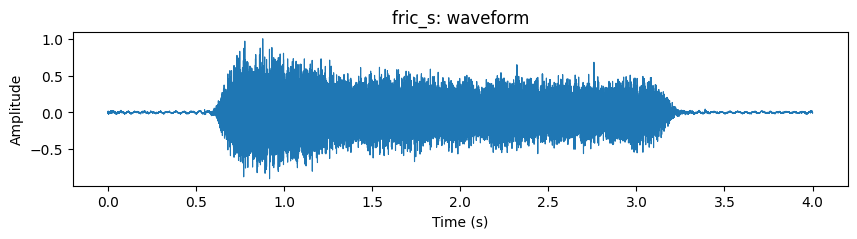

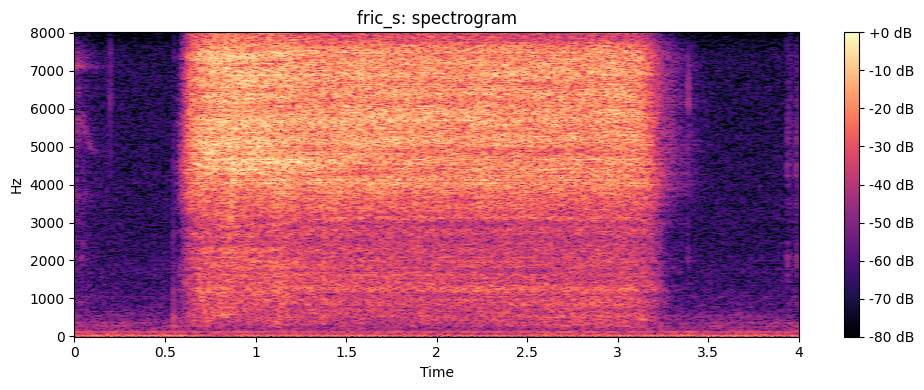

In [15]:
# TODO: sanity check (choose a few examples)
name = "self_sent_1"
x, fs = signals[name]
plot_waveform(x, fs, f"{name}: waveform")
plot_spectrogram(x, fs, f"{name}: spectrogram")
play_audio(x, fs)

name = "vowel_a"
x, fs = signals[name]
plot_waveform(x, fs, f"{name}: waveform")
plot_spectrogram(x, fs, f"{name}: spectrogram")
play_audio(x, fs)

name = "fric_s"
x, fs = signals[name]
plot_waveform(x, fs, f"{name}: waveform")
plot_spectrogram(x, fs, f"{name}: spectrogram")
play_audio(x, fs)


---

# 2. Same-Speaker Variability (Repeatability)

You recorded the same sentence 3 times.

### Task
Compare:
- speaking rate (duration)
- amplitude range / energy distribution
- timing differences (pauses)
- spectral patterns

You must include:
- Overlay plots for the three recordings (time-aligned if possible)
- At least one spectrogram comparison


In [ ]:
# TODO: Extract the 3 self recordings
x1, fs1 = signals["self_sent_1"]
x2, fs2 = signals["self_sent_2"]
x3, fs3 = signals["self_sent_3"]


16000


In [18]:
# TODO: Handle sampling rate mismatch (if any)
# Decide: resample to common fs or keep separate and explain.

# they already have a common fs
fs = fs1

In [23]:
# TODO: Compare durations and basic stats in a small table (markdown or printed)
for x, f in signals.values():
    print("Sampling rate (Hz):", f)
    print("Duration (s):", len(x)/f)
    print(f"Min/max amplitude: {x.min():.3f}/{x.max():.3f}")

Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.739/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.901/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.566/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.731/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.938/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.900/1.000
Sampling rate (Hz): 16000
Duration (s): 4.0
Min/max amplitude: -0.835/1.000
Sampling rate (Hz): 16000
Duration (s): 3.5170625
Min/max amplitude: -0.761/1.000


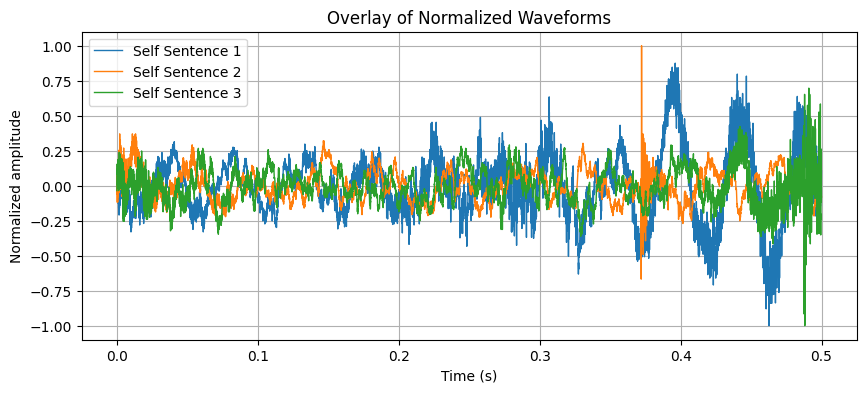

In [26]:
# TODO: Overlay waveforms (suggestion: normalize each to same max abs for viewing)
# Tip: plot the first N seconds or align to start-of-speech using a simple energy threshold

N_sec = 0.5
eps = 1e-12

signals_to_plot = [("Self Sentence 1", x1, fs1),
                   ("Self Sentence 2", x2, fs2),
                   ("Self Sentence 3", x3, fs3)]

plt.figure(figsize=(10,4))

for label, x, fs in signals_to_plot:

    N_samples = int(N_sec * fs)
    x_plot = x[:N_samples]

    x_plot = x_plot / (np.max(np.abs(x_plot)) + eps)

    t = np.arange(len(x_plot)) / fs
    plt.plot(t, x_plot, label=label, linewidth=1)

plt.xlabel("Time (s)")
plt.ylabel("Normalized amplitude")
plt.title("Overlay of Normalized Waveforms")
plt.grid(True)
plt.legend()
plt.show()

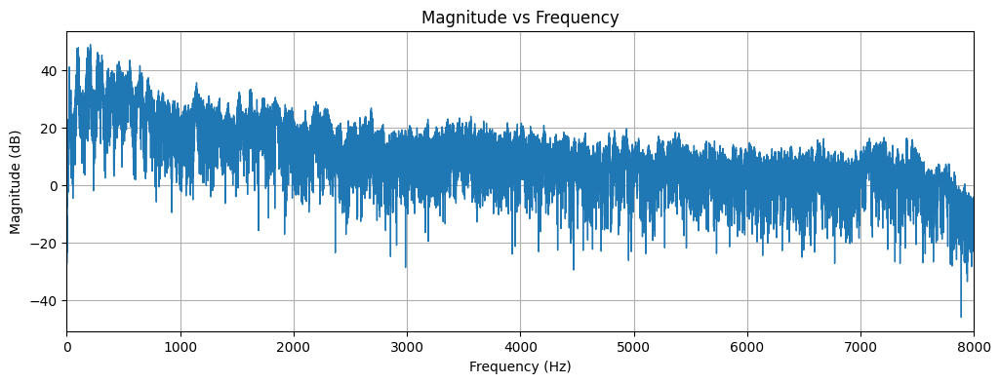

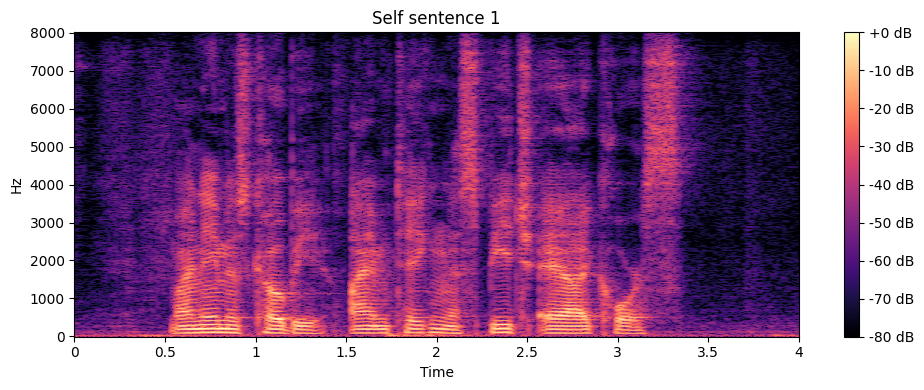

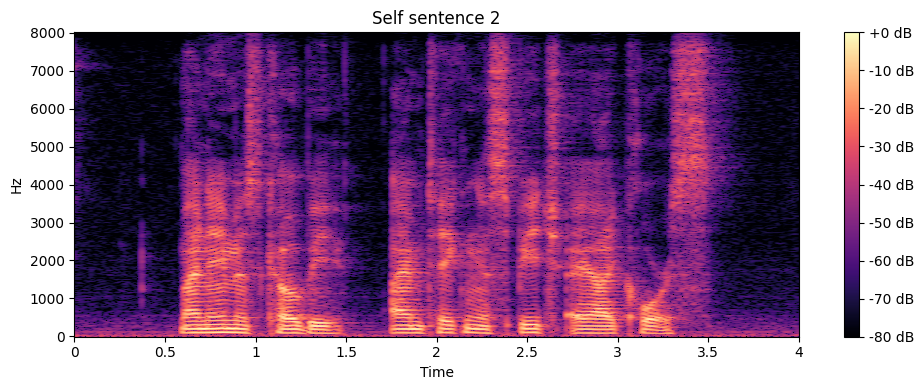

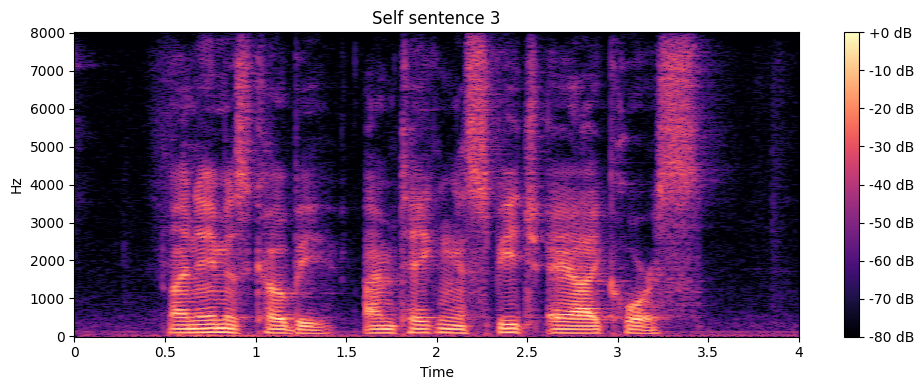

In [29]:
# TODO: Spectrogram comparison
f, m = magnitude_spectrum(x1,fs)
plot_spectrum(f,m)
plot_spectrogram(x1, fs, "Self sentence 1")
plot_spectrogram(x2, fs, "Self sentence 2")
plot_spectrogram(x3, fs, "Self sentence 3")


### Observations (Same speaker, repeats)

Answer in 10–14 lines:

- What stays stable across repeats?
- What changes the most (timing, amplitude, articulation clarity)?
- Is variability more obvious in waveform or spectrogram? Why?
- What does this suggest about “speech as a signal”?


### Answers

- The general structure of the waveform is the same since the general shape of the words is the same. There were a few differences but the overall structure was the same.
- The amplitude changed the most although that could be because of my mic. The timing was the same of the all of the them since I recorded 4 seconds and had the same speech pattern each time.
- There was more variability in the waveform. The spectrogram looked the same overall. The waveforms had different amplitudes and slight timing differences.
- It suggests that speech can be quasi-periodic when we look at a larger scale. However, there is still a lot of variability upon examining small windows.

---

# 3. Multi-Speaker Variability

Compare your sentence with another speaker (or a public clip).

### Task
Include:
- Waveform and spectrogram comparison
- At least one voiced region comparison (pitch differences)
- One unvoiced region comparison (fricative/noise differences)

> If you use a public clip, specify its source in a markdown cell.


### Clip taken from brightspace

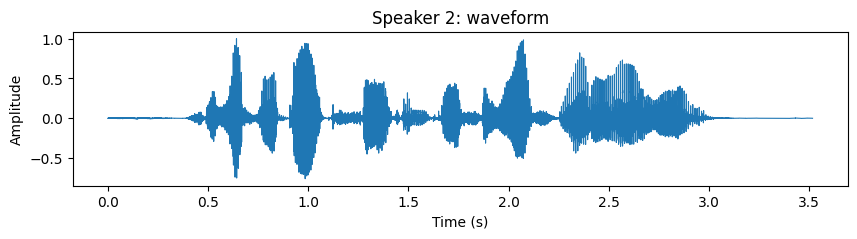

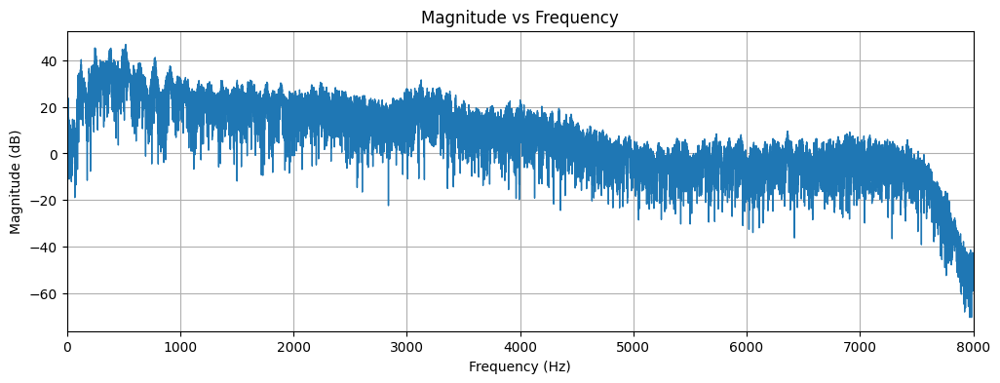

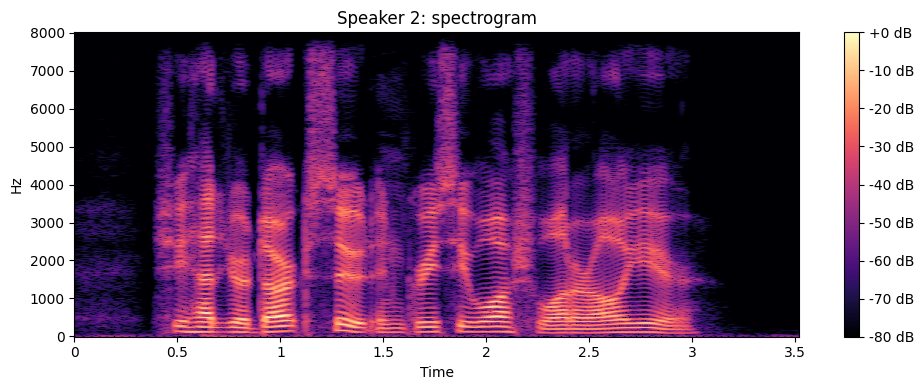

In [30]:
# TODO: Load second speaker sentence
xs, fss = signals["speaker2_sent_1"]
plot_waveform(xs, fss, "Speaker 2: waveform")
f, m = magnitude_spectrum(xs,fss)
plot_spectrum(f,m)
plot_spectrogram(xs, fss, "Speaker 2: spectrogram")
play_audio(xs, fss)


### Observations (Across speakers)

Answer in 10–14 lines:

- Compare pitch range (qualitatively or roughly estimate F0 from harmonics)
- Compare speaking rate
- Compare spectral envelope (formant regions)
- Which differences are likely anatomical vs habitual?


### Answers

- The pitch range seemed similar which is most likely because the human speech won't vary significantly in pitch.
- The speaker 2 had a faster speaking rate. We both spoke a sentence but the speaker clip is 3 seconds compared to my 4 seconds.
- The spectral envelope seemed more gradual in the self speaker signal than the speaker 2 signal.
- The difference in speed are likely habitual since it will vary by speaker but the other factors are likely anatomical since everyone has different vocal chords.

---

# 4. Sound Categories: Vowels vs Fricatives (Voiced vs Unvoiced)

You recorded:
- Vowels: /a/, /i/
- Fricatives: /s/, /f/

### Task
For each sound:
- Plot waveform (zoomed 50–100 ms)
- Plot spectrogram
- Describe the key differences

Focus on:
- periodicity vs noise
- energy distribution across frequency
- voicing cues


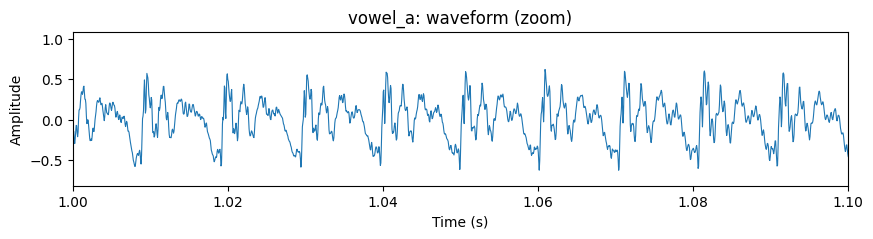

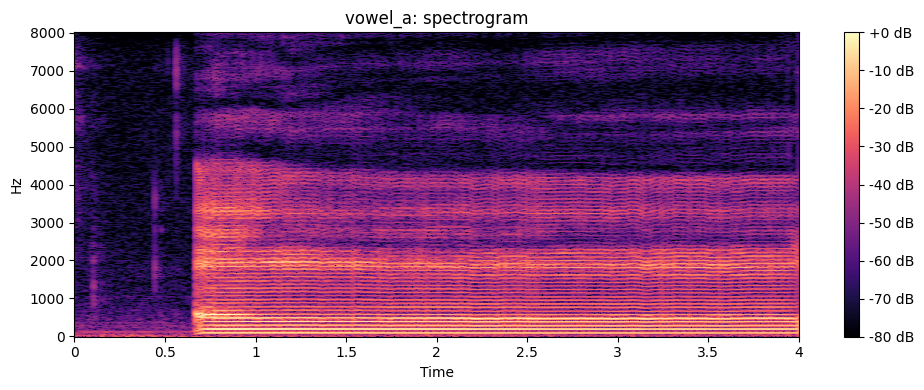

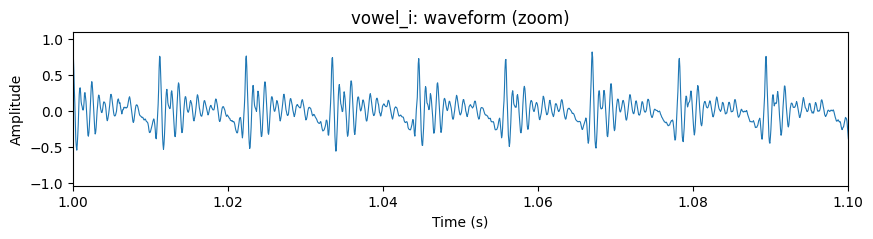

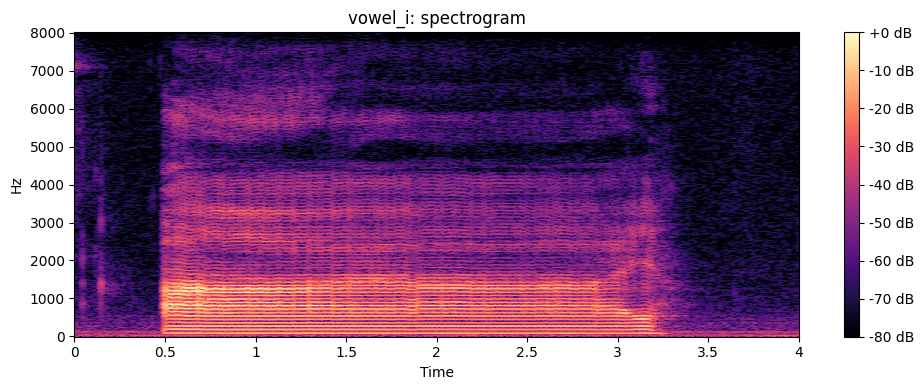

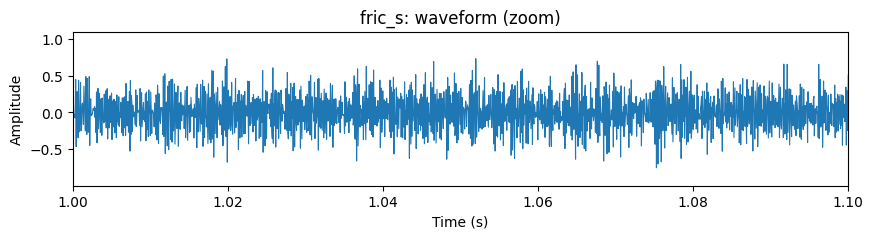

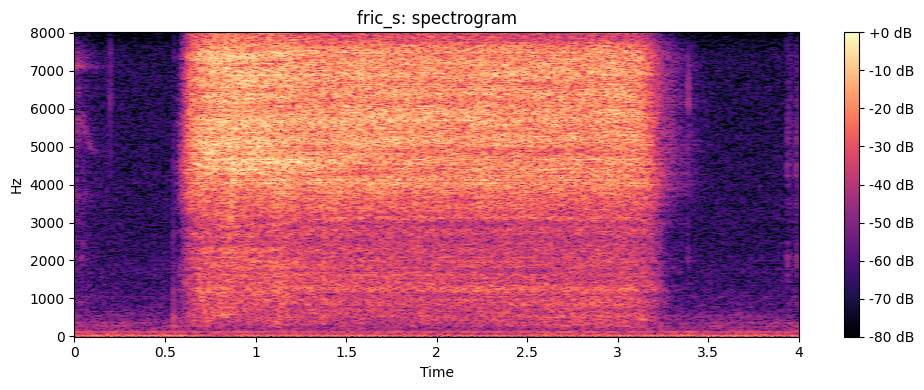

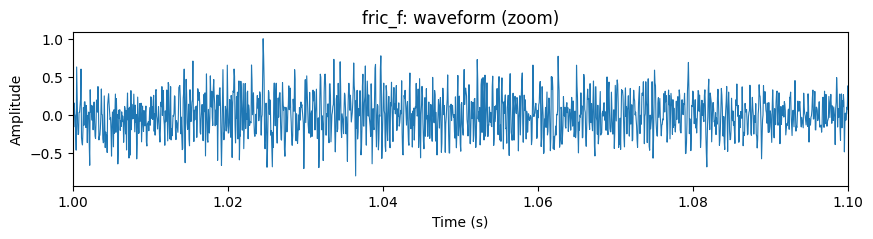

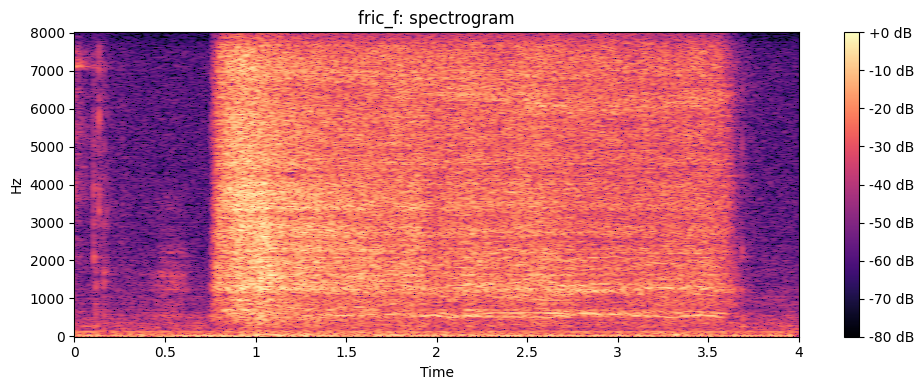

In [32]:
# TODO: Analyze each isolated sound
for name in ["vowel_a", "vowel_i", "fric_s", "fric_f"]:
    x, fs = signals[name]
    plot_waveform(x, fs, f"{name}: waveform (zoom)", tlim=(1.0, 1.1))
    plot_spectrogram(x, fs, f"{name}: spectrogram")
    play_audio(x, fs)


### Conceptual questions (Speech production)

Answer clearly:

1. Why do vowels show a harmonic structure but fricatives often do not?  
2. /s/ and /f/ are both unvoiced fricatives. Why do they sound different?  
3. How do place and manner of articulation relate to what you see in the spectrogram?


### Answers

1. Vowels are voiced which require vocal fold vibrations. This means they will demonstrate some periodicity. Fricatives are not since they are unvoiced airflow, as such we don't see any harmonic structure.
2. Our mouths/lips create different shapes when we push air through to make these sounds. Thus, we get vastly different noises.
3. Articulation is reflected in the spectrogram whether the energy is harmonic, silent, or noisy.

---

# 5. Segmentation: Words → Syllables → Phones (Approx.)

### Goal
Take one of your self-sentences and annotate:
- Word boundaries (start/end times)
- Syllable boundaries (approx.)
- Phone-level boundaries for at least **one word** (approx.)

You must provide **evidence**:
- waveform plot with vertical lines
- spectrogram plot with vertical lines
- playback of each segmented region

> You do not need perfect phonetic labeling. We evaluate reasoning and evidence.


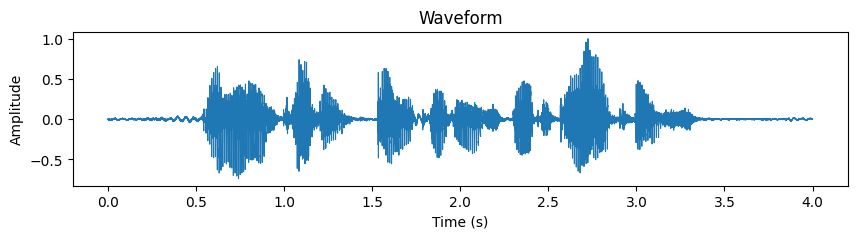

In [34]:
# TODO: Choose the recording to segment
seg_name = "self_sent_1"
x, fs = signals[seg_name]
play_audio(x,fs)
plot_waveform(x,fs)


## 5.1 Define boundaries (in seconds)

### Task
Create lists of boundary times.

Examples:
- `word_bounds = [(t0,t1,"My"), (t1,t2,"name"), ...]`
- `syll_bounds = [(t0,t1,"my"), (t1,t2,"name"), ...]`  (approx.)
- `phone_bounds = [(t0,t1,"m"), (t1,t2,"ay"), ...]`   (approx. for one word)

You may use:
- waveform inspection
- spectrogram inspection
- listening + trial-and-error


In [36]:
# TODO: Fill these with your boundary estimates (seconds)
word_bounds = [
    # (start, end, "label"),
    (0.5,0.65,"My"),
    (0.65,1.0,"name"),
    (1.0,1.1,"is"),
    (1.1,1.4,"Kobe"),
    (1.5,1.6,"I"),
    (1.6,1.7,"am"),
    (1.7,2.1,"taking"),
    (2.1,2.2,"a"),
    (2.2,2.6,"speech"),
    (2.6,2.8,"AI"),
    (2.8,3.2,"course")
]

syll_bounds = [
    # (start, end, "label"),
    (0.5,0.65,"My"),
    (0.65,1.0,"name"),
    (1.0,1.1,"is"),
    (1.1,1.2,"Ko"),
    (1.2,1.4,"be"),
    (1.5,1.6,"I"),
    (1.6,1.7,"am"),
    (1.7,1.9,"tak"),
    (1.9,2.1,"ing"),
    (2.1,2.2,"a"),
    (2.2,2.6,"speech"),
    (2.6,2.7,"A"),
    (2.7,2.8,"I"),
    (2.8,3.2,"course")
]

phone_bounds = [
    # For ONE chosen word only
    # (start, end, "label"),
    (1.1,1.2,"K"),
    (1.2,1.3,"o"),
    (1.3,1.4,"be")
]


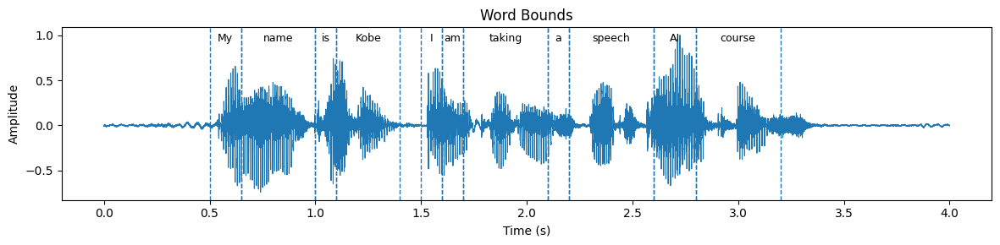

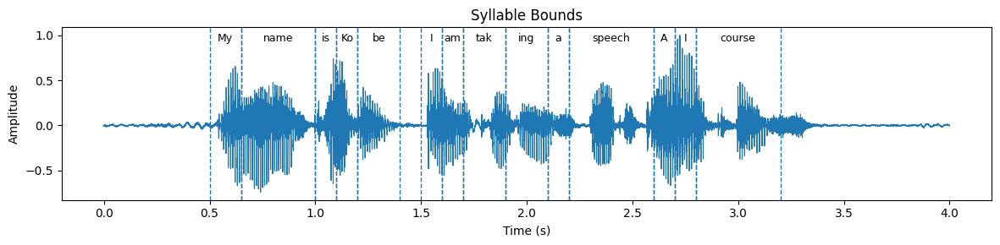

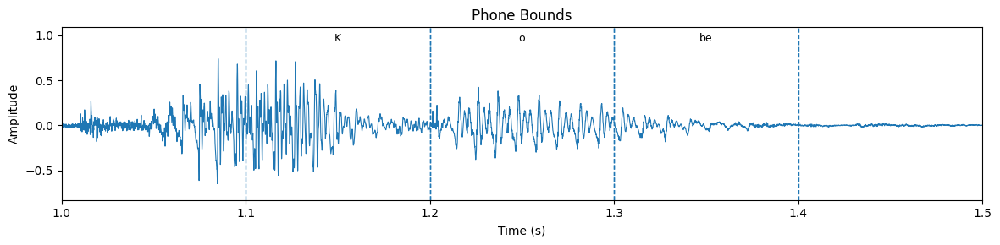

In [37]:
# TODO: Plot waveform with boundaries
# - Overlay word boundaries in one plot
# - Overlay syllable boundaries in another plot
# - Overlay phone boundaries for one word (zoomed)

def plot_with_bounds(x, fs, bounds, title, tlim=None):
    t = np.arange(len(x)) / fs
    plt.figure(figsize=(12, 3))
    plt.plot(t, x, linewidth=0.8)
    
    for (start, end, label) in bounds:
        plt.axvline(start, linestyle="--", linewidth=1)
        plt.axvline(end, linestyle="--", linewidth=1)
        plt.text((start + end)/2, 0.9*np.max(np.abs(x)),
                 label, ha="center", va="bottom", fontsize=9)
    
    if tlim is not None:
        plt.xlim(tlim)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_with_bounds(x,fs,word_bounds,"Word Bounds")
plot_with_bounds(x,fs,syll_bounds,"Syllable Bounds")
plot_with_bounds(x,fs,phone_bounds,"Phone Bounds",(1.0,1.5))

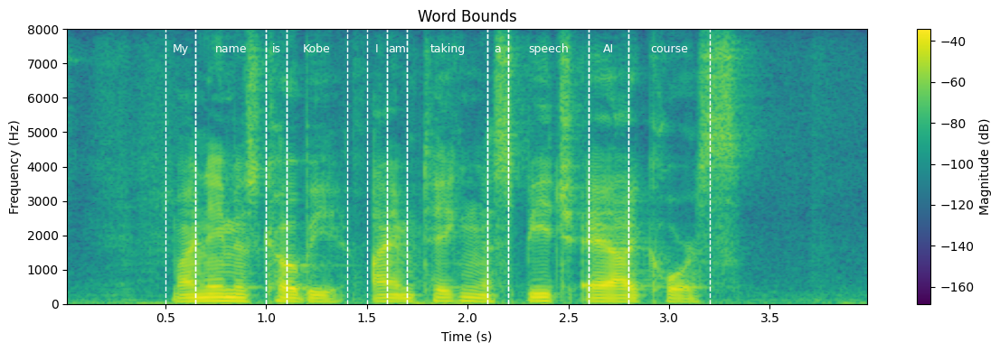

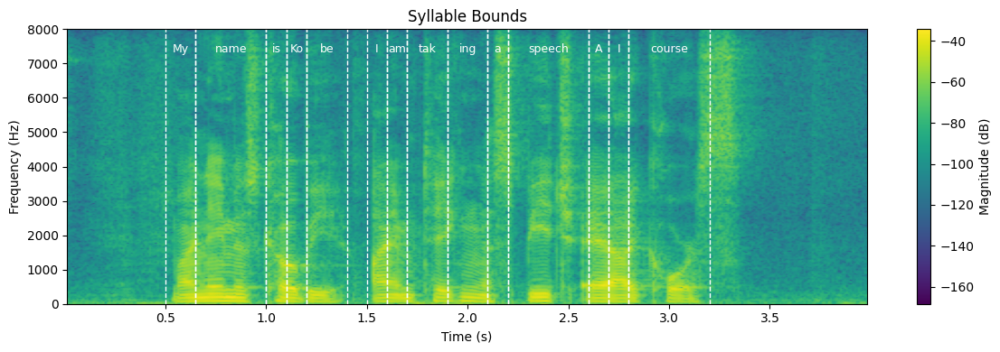

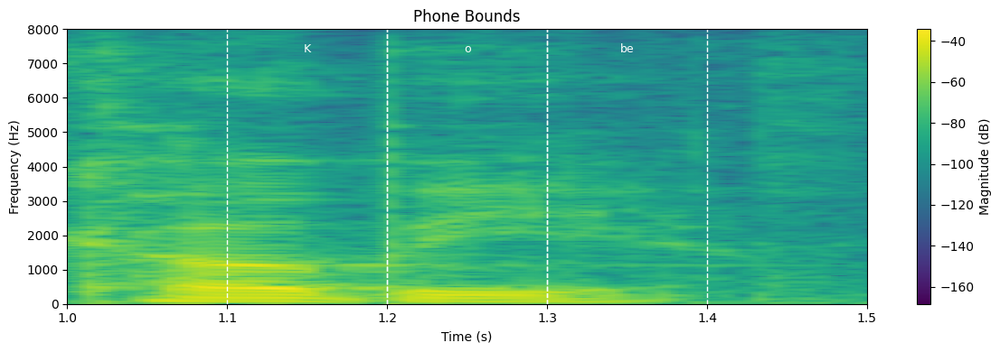

In [39]:
# TODO: Plot spectrogram with boundaries
# Use vertical lines (plt.axvline) at boundary times
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

def plot_spectrogram_with_bounds(x, fs, bounds, title,
                                 n_fft=1024, win_ms=25, hop_ms=10,
                                 tlim=None):
    # Convert ms → samples
    win_len = int(win_ms * fs / 1000)
    hop_len = int(hop_ms * fs / 1000)

    # Compute spectrogram
    f, t, Sxx = spectrogram(
        x,
        fs=fs,
        window='hann',
        nperseg=win_len,
        noverlap=win_len - hop_len,
        nfft=n_fft,
        scaling='density',
        mode='magnitude'
    )

    plt.figure(figsize=(12, 4))
    plt.pcolormesh(t, f, 20 * np.log10(Sxx + 1e-12), shading='gouraud')
    plt.colorbar(label='Magnitude (dB)')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.title(title)

    # Overlay boundaries
    for (start, end, label) in bounds:
        plt.axvline(start, color='white', linestyle='--', linewidth=1)
        plt.axvline(end, color='white', linestyle='--', linewidth=1)
        plt.text((start + end) / 2, 0.95 * fs / 2,
                 label, color='white', ha='center', va='top', fontsize=9)

    if tlim is not None:
        plt.xlim(tlim)

    plt.ylim(0, fs / 2)
    plt.tight_layout()
    plt.show()

plot_spectrogram_with_bounds(x,fs,word_bounds,"Word Bounds")
plot_spectrogram_with_bounds(x,fs,syll_bounds,"Syllable Bounds")
plot_spectrogram_with_bounds(x,fs,phone_bounds,"Phone Bounds",tlim=(1.0,1.5))

In [40]:
# TODO: Play segments
# For each word in word_bounds:
#   extract and play that segment
# For each syllable in syll_bounds:
#   extract and play
# For phone_bounds (one word):
#   extract and play

def extract_segment(x, fs, start, end):
    i0 = int(start * fs)
    i1 = int(end * fs)
    return x[i0:i1]

print("Words:")
for start, end, label in word_bounds:
    seg = extract_segment(x, fs, start, end)
    print(label)
    display(Audio(seg, rate=fs))

print("Syllables")
for start, end, label in syll_bounds:
    seg = extract_segment(x, fs, start, end)
    print(label)
    display(Audio(seg, rate=fs))

print("Kobe")
for start, end, label in phone_bounds:
    seg = extract_segment(x, fs, start, end)
    print(label)
    display(Audio(seg, rate=fs))

Words:
My


name


is


Kobe


I


am


taking


a


speech


AI


course


Syllables
My


name


is


Ko


be


I


am


tak


ing


a


speech


A


I


course


Kobe
K


o


be


### Observations (Segmentation & coarticulation)

Answer in 12–16 lines:

- Which boundaries were easy to identify? Which were hard? Why?
- Where do you see coarticulation (smooth transitions rather than clear breaks)?
- Give one example where the phone boundary is ambiguous, and explain why.


### Answers

- The larger words were very easy to identify since I could recognize them on the waveform. The smaller words like 'I', 'am', and 'a' were very hard and I couldn't get them completely right.
- I see smoother transitions with the last part of my name and AI. Since the sounds aren't too different, especially with AI, the sound starts towards the next before its over. This blends them together and helps the transition sound more natural.
- The phone boundary in AI was ambigious since they are both vowels so I chose to do my name instead since the phones were easier to identify. The 'A' starts sounding like and an 'I' before the actual I is said which causes the ambiguous boundary.

---

# 6. Mini-Analysis: Voiced vs Voiceless Regions in a Sentence

### Task
Pick two short regions from your sentence:
- one clearly voiced (vowel-like)
- one clearly voiceless (fricative-like or unvoiced consonant)

For each region:
- plot waveform (zoom)
- plot spectrum or spectrogram
- explain differences in terms of production and acoustics


In [41]:
# TODO: Define two regions (seconds)
voiced_region = (0.5, 0.65)
voiceless_region = (3.0, 3.2)


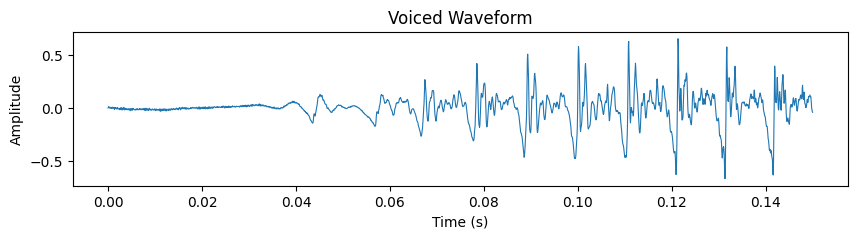

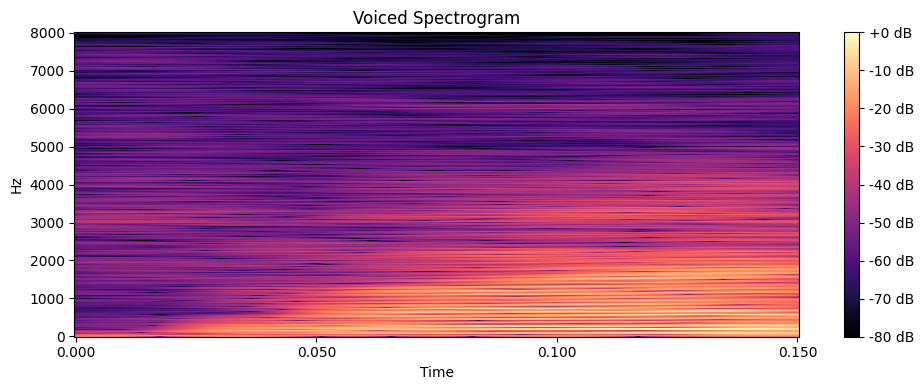

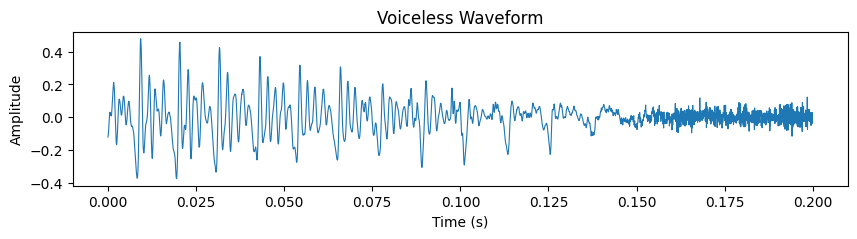

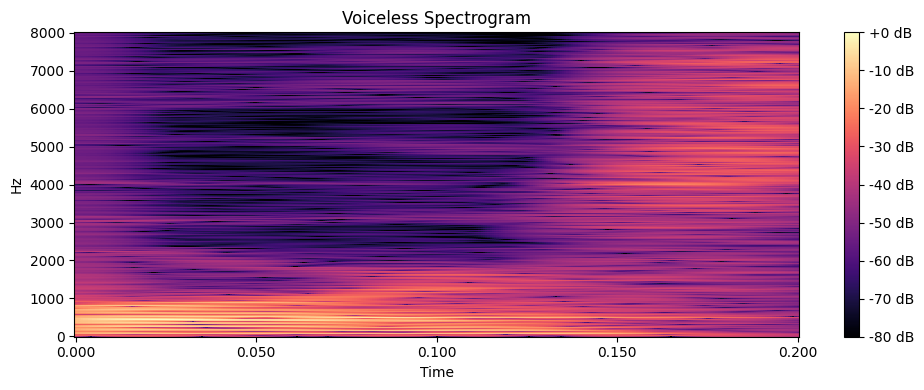

In [43]:
# TODO: Extract, plot, and play the two regions
x_v = extract_segment(x,fs,voiced_region[0],voiced_region[1])
x_vl = extract_segment(x,fs,voiceless_region[0],voiceless_region[1])

play_audio(x_v,fs)
plot_waveform(x_v,fs,"Voiced Waveform")
plot_spectrogram(x_v,fs,"Voiced Spectrogram")

play_audio(x_vl,fs)
plot_waveform(x_vl,fs,"Voiceless Waveform")
plot_spectrogram(x_vl,fs,"Voiceless Spectrogram")

### Conceptual explanation (Voicing)

Write 8–12 lines:

- How does voicing appear in waveform and spectrogram?
- What cues did you use to label a region as voiced vs voiceless?


### Answers

- Voiced sounds have quasi-periodic behavior as we learned in the previous notebooks. In addition we can see higher energy from the graphs above.
- In contrast wit this the voiceless waveform has no periodic behavior and looks more flat. The spectrograms above also show less energy.
- I started by picking parts of the sentence with sounds I knew were voiced/voiceless. I looked for harmonics in the spectrogram but I was having trouble so I decided to rely on periodicity in the waveform graph.

---

# 7. Summary: Key Takeaways

Write 8–12 lines:

- What did you learn about speech variability (same speaker vs different speaker)?
- What did segmentation teach you about coarticulation?
- How did speech production theory help you interpret your plots?


### Answers

- I learned that there is a small amount of variability for the same speaker with factors such as amplitude. The timing and energy was relatively similar though.
- I was surprised at how much different speakers had in common. I never thought about how much human speech has in common among speakers.
- It taught me how our sentences flow from one phone to another. It makes speech sound natural instead of making strict boundaries between phones.
- Understanding source and filter as well as the role of vocal folds helped me interpret and graphs and look deeper into the frequency of the plots.

---

# 8. Reflection (Mandatory)

Write thoughtful answers (be specific):

1. What did you learn about your own speech signal that surprised you?  
2. What was the hardest part: recording, organizing files, variability analysis, or segmentation? Why?  
3. Which visualization helped most (waveform vs spectrogram vs playback)?  
4. If you could redo one part, what would you do differently?  
5. What is one question you now want to explore further (e.g., pitch tracking, formant estimation, phoneme classification)?


### Answers

1. I was surprised that my amplitude varied a lot among my different recordings. I didn't think that I spoke particularly loud/soft so I didn't expect it at all.
2. Segmentation was the hardest because of trial and error. I also had to figure out the boundaries which took a while.
3. The waveform helped the most because it shows the amplitude and temporal relations across sent 1, 2, and 3.
4. If I could redo one part I would see what other graphs I could make to compare my own speech. It would be interesting to find more differences.
5. Going off that I would want to explore the question of how speech differs across the same speaker more. Phoneme classification and look at variations across the same speaker would be interesting.

---

# 9. AI Use Disclosure (Required)

If you used any AI tools (including ChatGPT), briefly describe:
- What you used it for (e.g., debugging, concept clarification)
- What you wrote/changed yourself

*(If you did not use AI, write “No AI tools used.”)*


I used AI to help me graph the boundaries.